<a href="https://colab.research.google.com/github/aminyG/PCVK_Ganjil_2023/blob/main/Week11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

In [2]:
# Drive access
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


#### 2. Implement 6 template matching methods in OpenCV using the cats_and_bunnies.jpg and cat2_templatejpg.jpg images as templates.

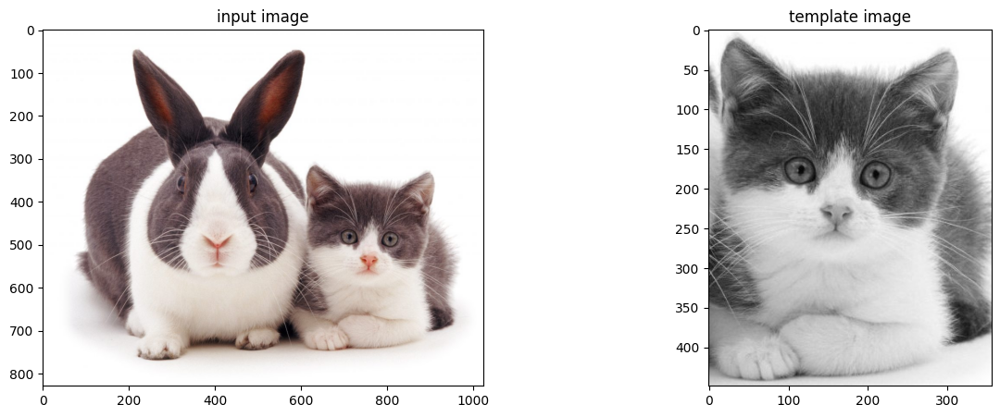

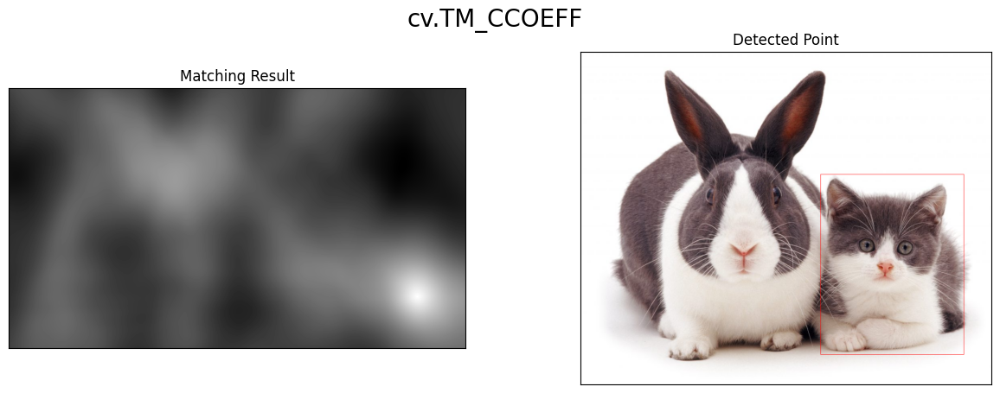

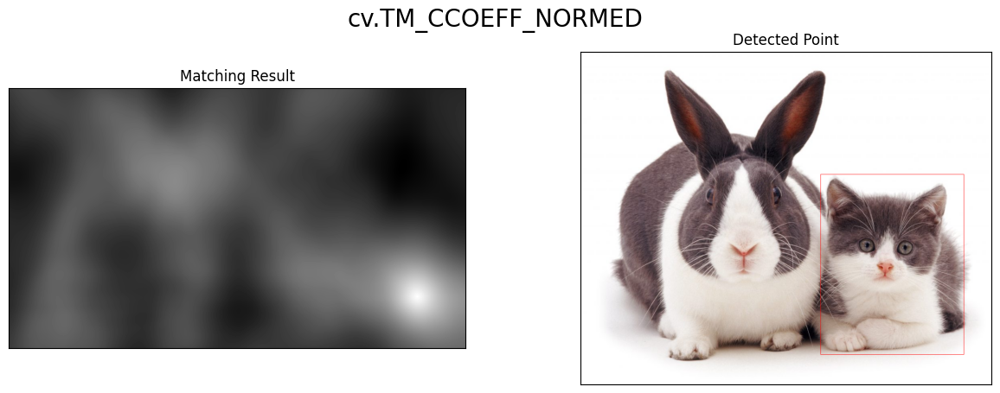

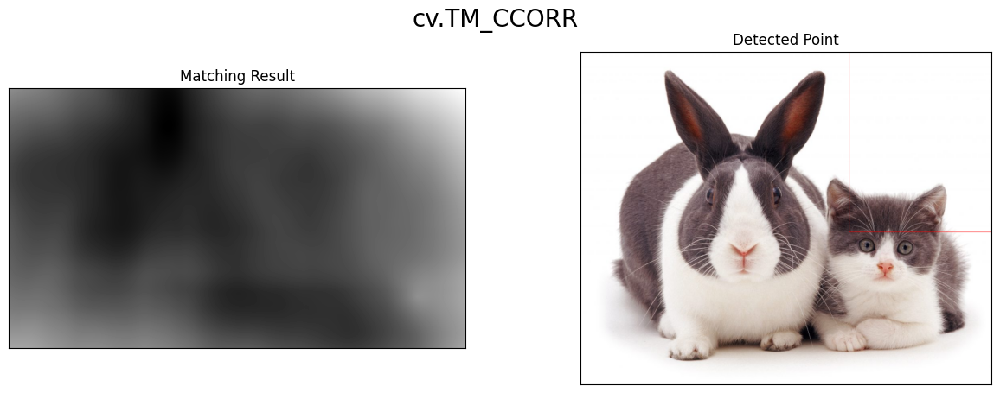

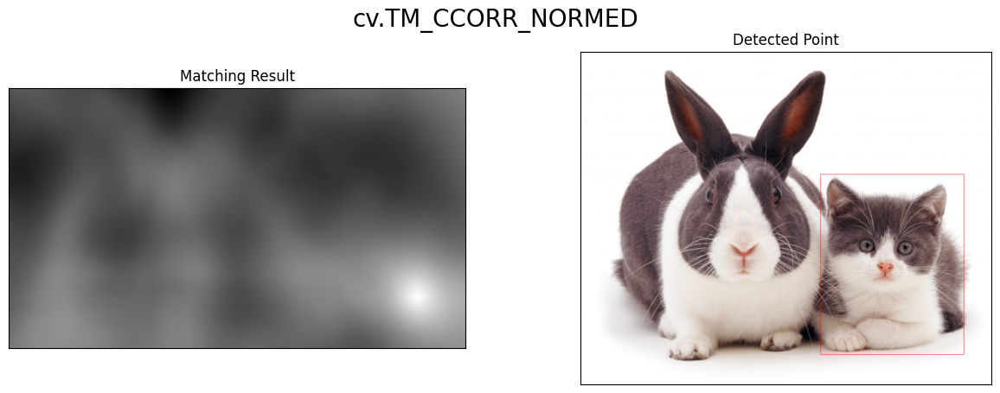

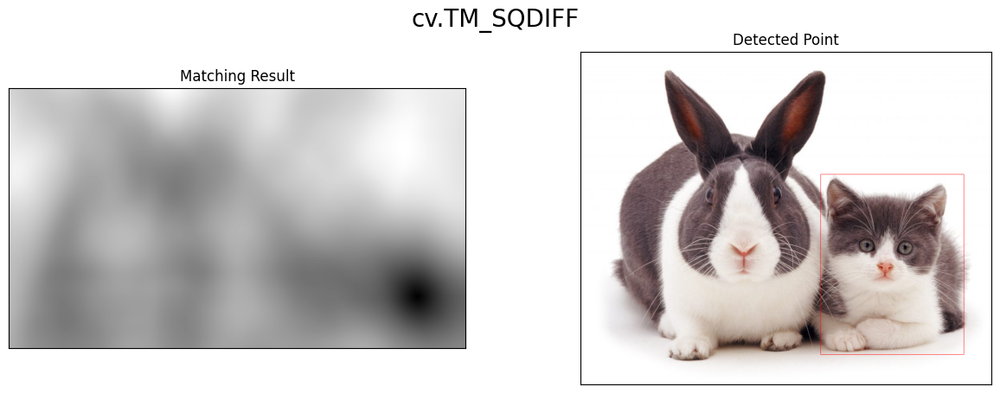

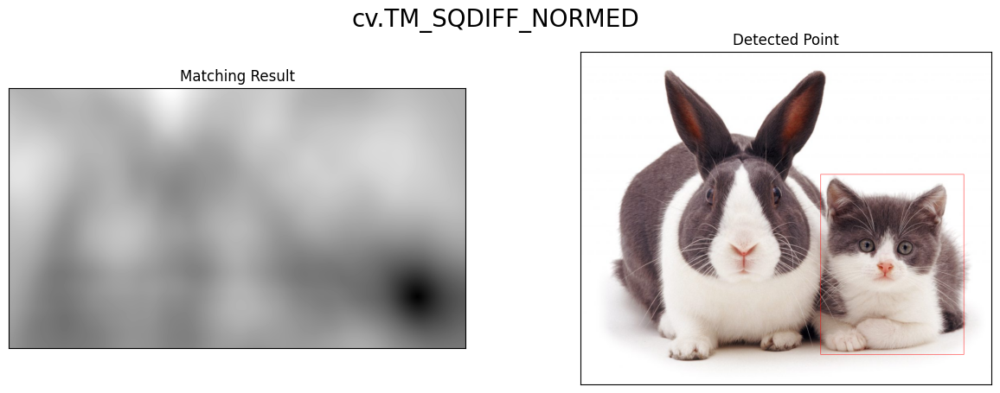

In [4]:
# load input image
img = cv.imread('/content/drive/MyDrive/pcvk/photo/Object Detection/cats_and_bunnies.jpg')
img_gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)
img2 = img.copy()

#load template image
template = cv.imread('/content/drive/MyDrive/pcvk/photo/Object Detection/cat2_templatejpg.jpg',0)
# image dimensions
w, h = template.shape[::-1]

# print input image and template
f, axarr = plt. subplots(1,2,figsize=(15,5)) #create 2 plots for input image and template
axarr[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB)), axarr[0].set_title("input image")
axarr[1].imshow(cv.cvtColor(template, cv.COLOR_BGR2RGB)), axarr[1].set_title("template image")

# All the 6 methods for comparison in a list
methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
            'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']

for meth in methods:
    img = img2.copy()
    method = eval(meth)
    # Apply template Matching
    res = cv.matchTemplate(img_gray,template,method)
    min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)
    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)

    cv.rectangle(img,top_left, bottom_right,(0,0,255))
    plt.figure(figsize=(15,5))
    plt.subplot(121),plt.imshow(res,cmap = 'gray')
    plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
    print("\n\n")
    plt.suptitle(meth, fontsize=20)
    plt.show()

#### 3. Implementasikan konsep template matching tanpa menggunakan library OpenCV untuk multiple object, menggunakan gambar bahrain.jpg untuk citra masukan dan bahrain-template.jpg sebagai citra template, sehingga menghasilkan output sebagai berikut:

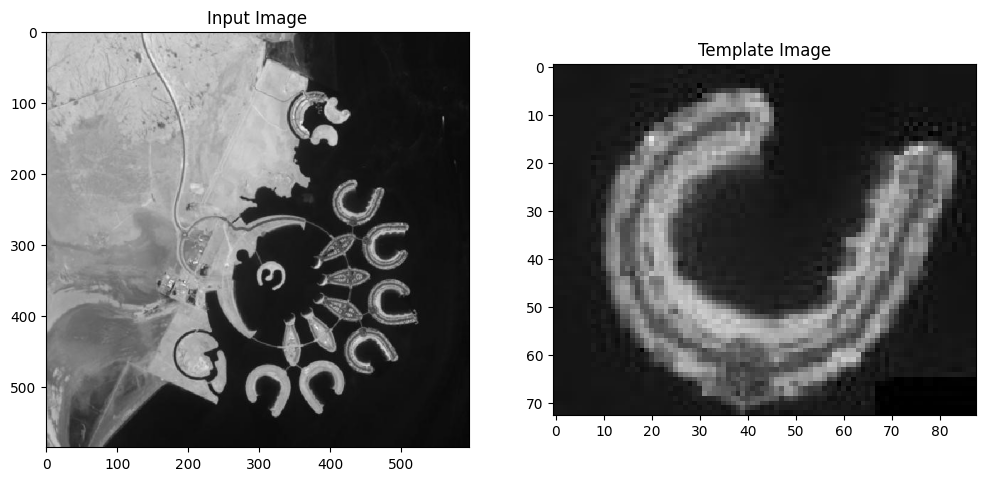

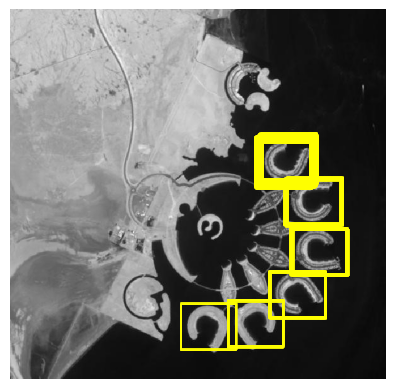

In [7]:
from skimage.feature import match_template

img = cv.imread('/content/drive/MyDrive/pcvk/photo/Object Detection/bahrain.jpg', 0)
template = cv.imread('/content/drive/MyDrive/pcvk/photo/Object Detection/bahrain-template.jpg', 0)

f, axarr = plt. subplots(1,2,figsize=(12,8))
axarr[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB)), axarr[0].set_title("Input Image")
axarr[1].imshow(cv.cvtColor(template, cv.COLOR_BGR2RGB)), axarr[1].set_title("Template Image")

# Hitung kemiripan citra dengan citra template
result = match_template(img, template)

# Tentukan threshold untuk menentukan hasil match
threshold = 0.45
locations = np.where(result >= threshold)

# Plot hasil match
fig, ax = plt.subplots()
ax.imshow(img, cmap=plt.cm.gray)
ax.set_axis_off()
height, width = template.shape
for loc in zip(*locations[::-1]):
    rect = plt.Rectangle(loc, width, height, edgecolor='yellow', facecolor='none', linewidth=0.5)
    ax.add_patch(rect)

plt.show()

#### 3. Implement the Sobel Edge Detection, Canny Edge Detection, and Laplacian Edge Detection methods in OpenCV using the parking-lot-cars.jpg image, resulting in the following output:


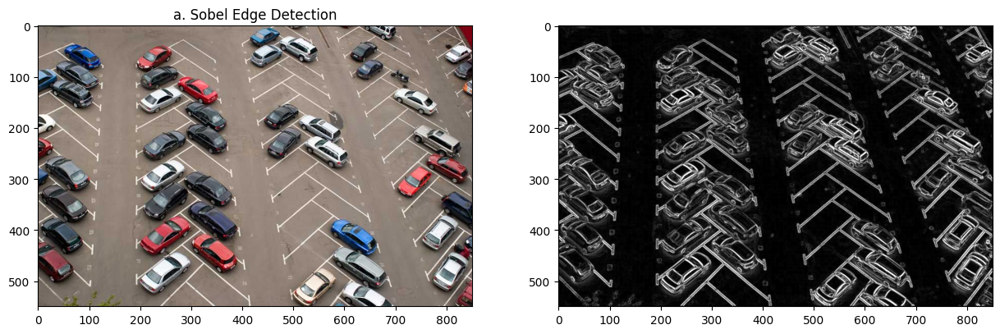

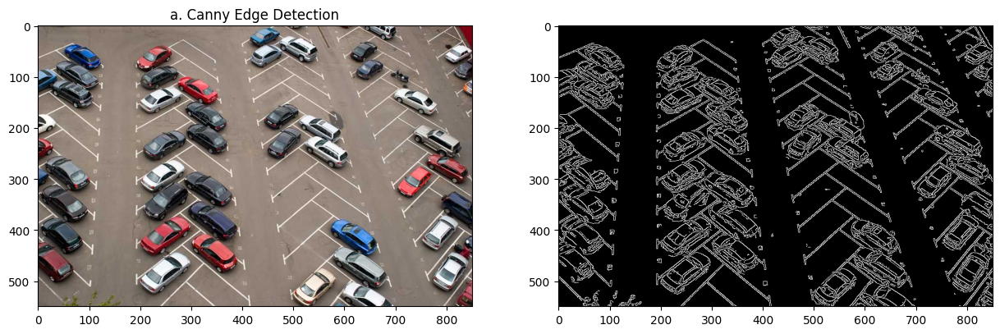

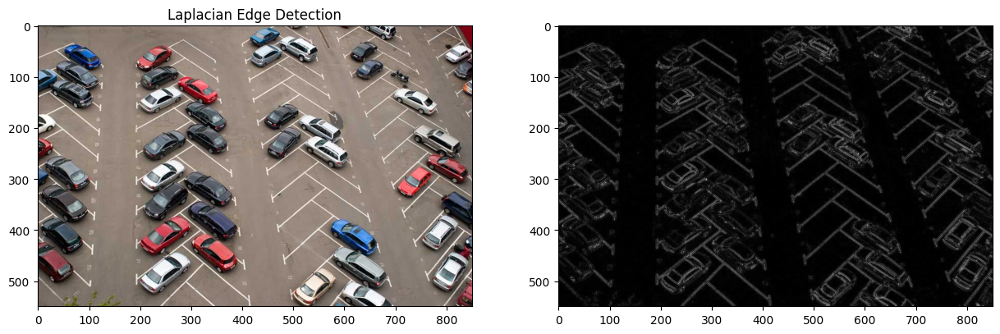

In [22]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img0 = cv.imread('/content/drive/MyDrive/pcvk/photo/Object Detection/parking-lot-cars.jpg')

# a. Sobel Edge Detection

# converting to gray scale
gray = cv.cvtColor(img0, cv.COLOR_BGR2GRAY)

# remove noise
img = cv.GaussianBlur(gray, (3, 3), 0)

# obtaining a horizontal and vertical Sobel filtering of the image
img_sobelx = cv.Sobel(img, cv.CV_64F, 1, 0, ksize=3)
img_sobely = cv.Sobel(img, cv.CV_64F, 0, 1, ksize=3)

# image with both horizontal and vertical Sobel kernels applied
img_sobelxy = cv.addWeighted(cv.convertScaleAbs(img_sobelx), 0.5, cv.convertScaleAbs(img_sobely), 0.5, 0)

f, axarr = plt.subplots(1, 2, figsize=(15, 5))
plt.subplot(121), plt.imshow(cv.cvtColor(img0, cv.COLOR_BGR2RGB))
axarr[0].imshow(cv.cvtColor(img0, cv.COLOR_BGR2RGB))
axarr[0].set_title('a. Sobel Edge Detection')
plt.subplot(122), plt.imshow(img_sobelxy, cmap='gray')
axarr[1].imshow(cv.cvtColor(img_sobelxy, cv.COLOR_BGR2RGB))

# b. Canny Edge Detection

edged = cv.Canny(img0, 100, 200)

# Plot outputs
f, axarr = plt.subplots(1,2,figsize=(15,5))
plt.subplot(121), plt.imshow(cv.cvtColor(img0, cv.COLOR_BGR2RGB))
axarr[0].imshow(cv.cvtColor(img0, cv.COLOR_BGR2RGB))
axarr[0].set_title('a. Canny Edge Detection')
plt.subplot(122), plt.imshow(edged, cmap = 'gray')
axarr[1].imshow(cv.cvtColor(edged, cv.COLOR_BGR2RGB))

# c. Laplacian Edge Detection
f, axarr = plt.subplots(1,2,figsize=(15,5))
img_laplacian = cv.Laplacian(img, cv.CV_64F)
img_laplacian = cv.convertScaleAbs(img_laplacian)
axarr[0].imshow(cv.cvtColor(img0, cv.COLOR_BGR2RGB))
axarr[0].set_title('Laplacian Edge Detection')
axarr[1].imshow(img_laplacian, cmap='gray')
plt.show()


#### 4. Implementasikan metode Sobel Edge Detection, Canny Edge Detection, dan Laplacian Edge Detection pada OpenCV dengan menggunakan gambar car-park.jpg, sehingga menghasilkan luaran sebagai berikut:

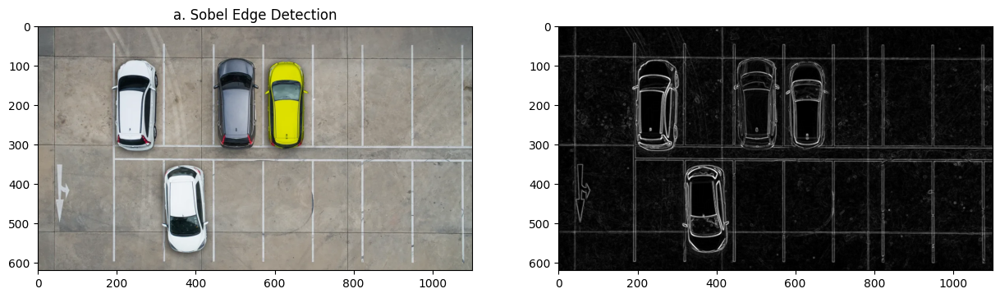

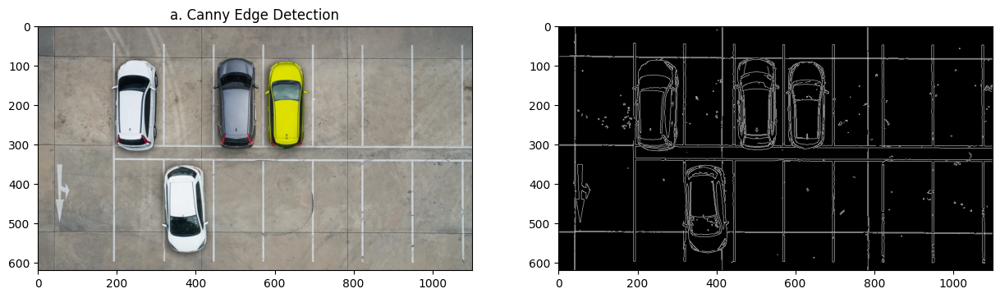

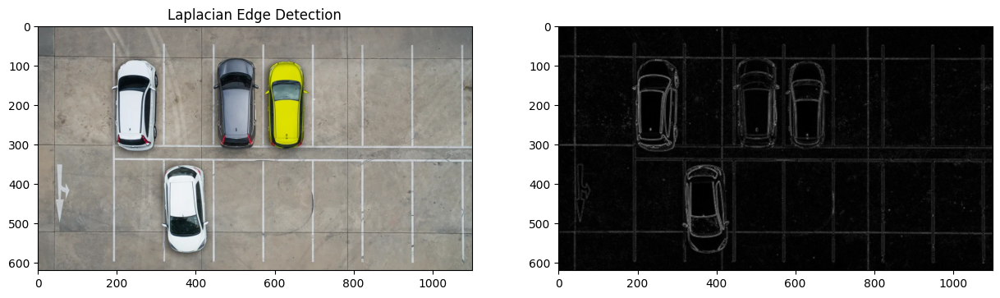

In [23]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img0 = cv.imread('/content/drive/MyDrive/pcvk/photo/Object Detection/car-park.jpg')

# a. Sobel Edge Detection

# converting to gray scale
gray = cv.cvtColor(img0, cv.COLOR_BGR2GRAY)

# remove noise
img = cv.GaussianBlur(gray, (3, 3), 0)

# obtaining a horizontal and vertical Sobel filtering of the image
img_sobelx = cv.Sobel(img, cv.CV_64F, 1, 0, ksize=3)
img_sobely = cv.Sobel(img, cv.CV_64F, 0, 1, ksize=3)

# image with both horizontal and vertical Sobel kernels applied
img_sobelxy = cv.addWeighted(cv.convertScaleAbs(img_sobelx), 0.5, cv.convertScaleAbs(img_sobely), 0.5, 0)

f, axarr = plt.subplots(1, 2, figsize=(15, 5))
plt.subplot(121), plt.imshow(cv.cvtColor(img0, cv.COLOR_BGR2RGB))
axarr[0].imshow(cv.cvtColor(img0, cv.COLOR_BGR2RGB))
axarr[0].set_title('a. Sobel Edge Detection')
plt.subplot(122), plt.imshow(img_sobelxy, cmap='gray')
axarr[1].imshow(cv.cvtColor(img_sobelxy, cv.COLOR_BGR2RGB))

# b. Canny Edge Detection

edged = cv.Canny(img0, 100, 200)

# Plot outputs
f, axarr = plt.subplots(1,2,figsize=(15,5))
plt.subplot(121), plt.imshow(cv.cvtColor(img0, cv.COLOR_BGR2RGB))
axarr[0].imshow(cv.cvtColor(img0, cv.COLOR_BGR2RGB))
axarr[0].set_title('a. Canny Edge Detection')
plt.subplot(122), plt.imshow(edged, cmap = 'gray')
axarr[1].imshow(cv.cvtColor(edged, cv.COLOR_BGR2RGB))

# c. Laplacian Edge Detection
f, axarr = plt.subplots(1,2,figsize=(15,5))
img_laplacian = cv.Laplacian(img, cv.CV_64F)
img_laplacian = cv.convertScaleAbs(img_laplacian)
axarr[0].imshow(cv.cvtColor(img0, cv.COLOR_BGR2RGB))
axarr[0].set_title('Laplacian Edge Detection')
axarr[1].imshow(img_laplacian, cmap='gray')
plt.show()


#### 4. Implement the Sobel Edge Detection, Canny Edge Detection, and Laplacian Edge Detection methods in OpenCV using the parking-lot-cars.jpg image, resulting in the following output:

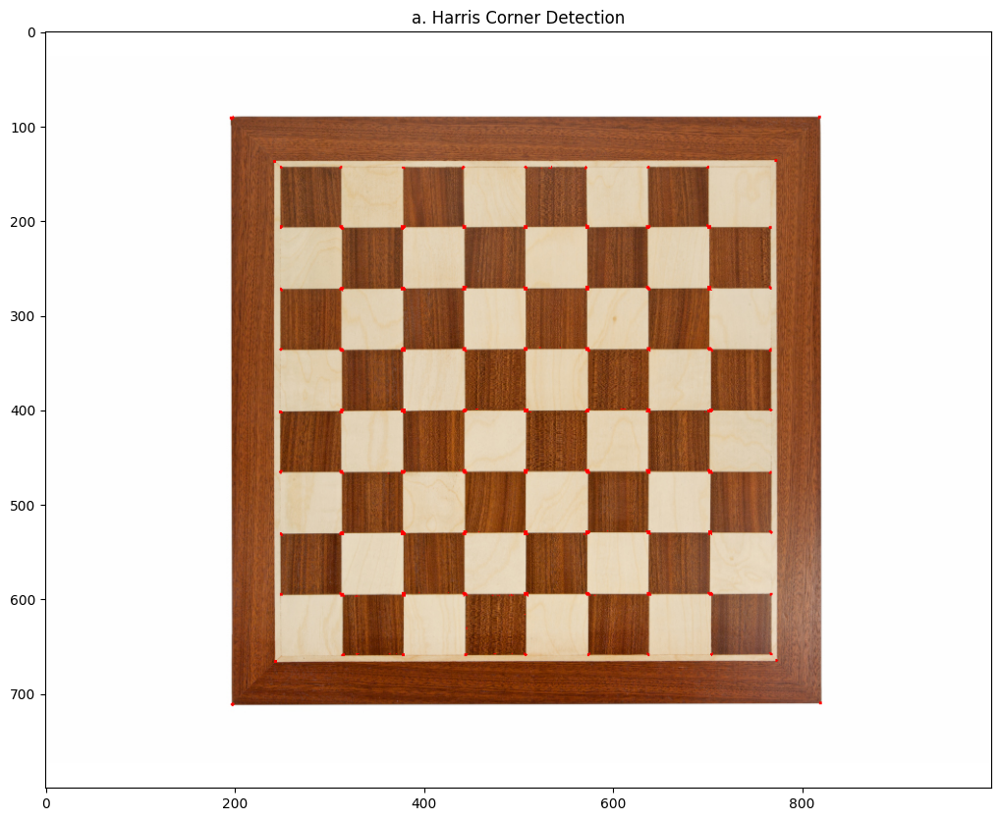

In [24]:
# Load input image
input_img = cv.imread('/content/drive/MyDrive/pcvk/photo/Object Detection/chess-board.jpg')
gray_img = cv.cvtColor(input_img, cv.COLOR_BGR2GRAY)
dst = cv.cornerHarris(gray_img, 3, 1, 0.04)

# Convert image to float32 data type
gray_img = np.float32(gray_img)
harris_output = cv.cornerHarris(gray_img, 2, 3, 3)

# Dilation of Harris Corner Detection results to mark corners
harris_output = cv.dilate(harris_output, None)

# Threshold to optimize value
input_img[dst > 0.01 * dst.max()] = [0, 0, 255]

# Show results with title "Harris Corner Detection"
plt.figure(figsize=(20, 10))
plt.imshow(cv.cvtColor(input_img, cv.COLOR_BGR2RGB))
plt.title("a. Harris Corner Detection")
plt.show()

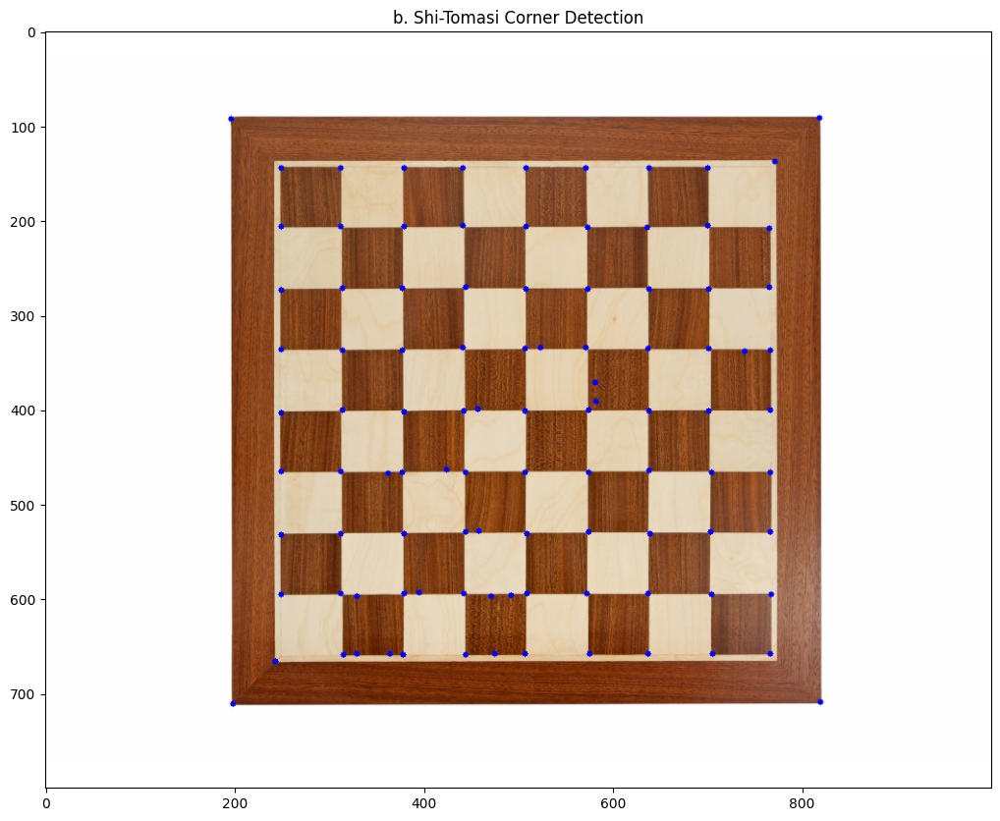

In [25]:
# Load input image
input_img = cv.imread('/content/drive/MyDrive/pcvk/photo/Object Detection/chess-board.jpg')
gray_img = cv.cvtColor(input_img, cv.COLOR_BGR2GRAY)

# Parameters for Shi-Tomasi Corner Detection
max_corners = 100
quality_level = 0.01
min_distance = 10

# Perform Shi-Tomasi Corner Detection
corners = cv.goodFeaturesToTrack(gray_img, max_corners, quality_level, min_distance)

# Convert corner coordinates to integers
corners = np.int0(corners)

# Draws a circle at the detected angle
for i in corners:
    x, y = i.ravel()
    cv.circle(input_img, (x, y), 3, 255, -1)

# Show results with title "Shi-Tomasi Corner Detection"
plt.figure(figsize=(20, 10))
plt.imshow(cv.cvtColor(input_img, cv.COLOR_BGR2RGB))
plt.title("b. Shi-Tomasi Corner Detection")
plt.show()

#### 5. Implement the Hough Transform method in OpenCV using the sudoku.jpg image. The stages of the grid detection process are in accordance with those contained in the theoretical review, resulting in the following output:

number of Hough lines: 33
Number of filtered lines: 1
Number of filtered lines: 2
Number of filtered lines: 3
Number of filtered lines: 4
Number of filtered lines: 5
Number of filtered lines: 6
Number of filtered lines: 7
Number of filtered lines: 8
Number of filtered lines: 9
Number of filtered lines: 10
Number of filtered lines: 11
Number of filtered lines: 12
Number of filtered lines: 13
Number of filtered lines: 14
Number of filtered lines: 14
Number of filtered lines: 15
Number of filtered lines: 15
Number of filtered lines: 15
Number of filtered lines: 16
Number of filtered lines: 16
Number of filtered lines: 17
Number of filtered lines: 17
Number of filtered lines: 18
Number of filtered lines: 18
Number of filtered lines: 19
Number of filtered lines: 19
Number of filtered lines: 19
Number of filtered lines: 20
Number of filtered lines: 20
Number of filtered lines: 20
Number of filtered lines: 20
Number of filtered lines: 20
Number of filtered lines: 20


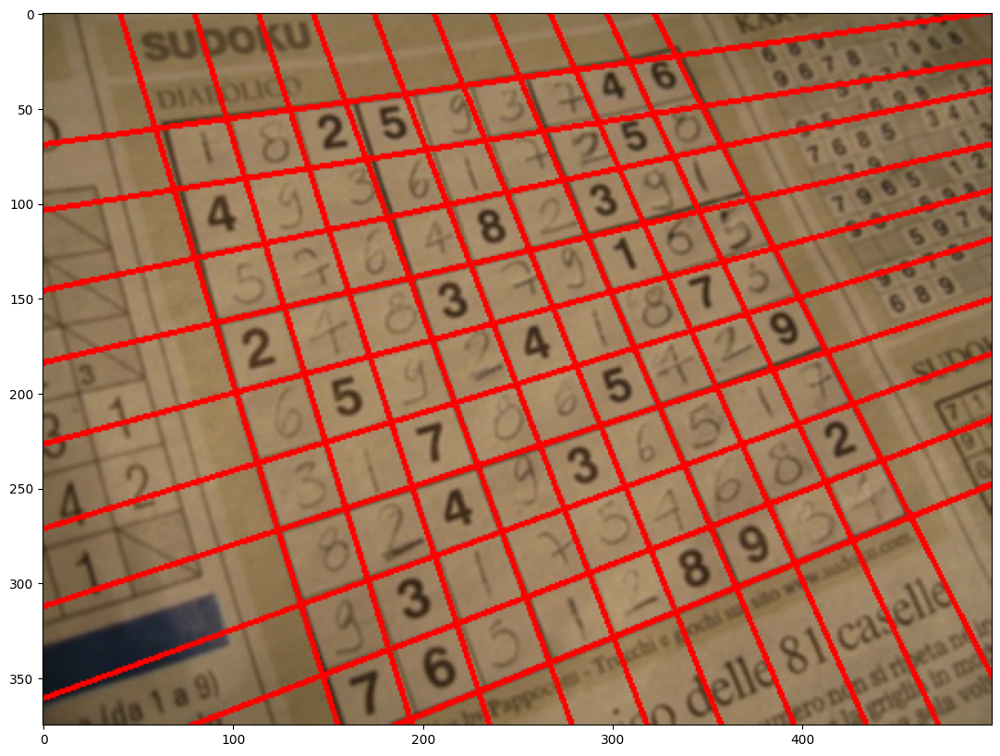

In [26]:
input_img = cv.imread('/content/drive/MyDrive/pcvk/photo/Object Detection/sudoku.jpg')
img_gray = cv.cvtColor(input_img, cv.COLOR_BGR2GRAY)

edges = cv.Canny (img_gray, 90, 150, apertureSize = 3)

kernel = np.ones((3,3), np.uint8)
edges = cv.dilate(edges,kernel,iterations = 1)

kernel = np.ones((5,5), np.uint8)
edges = cv.erode (edges, kernel, iterations = 1)

lines = cv.HoughLines(edges,1,np.pi/180,150)

if not lines.any():
    print('No lines were found')
    exit()
if filter:
    rho_threshold = 15
    theta_threshold = 0.1
    similar_lines = {i : [] for i in range(len(lines))}
    for i in range(len(lines)):
      for j in range (len (lines)):
        if i == j:
            continue
        rho_i, theta_i = lines[i][0]
        rho_j, theta_j = lines[j][0]
        if abs(rho_i - rho_j) < rho_threshold and abs (theta_i - theta_j) < theta_threshold:
            similar_lines[i].append(j)
    indices = [i for i in range(len(lines))]
    indices.sort(key=lambda x: len(similar_lines[x]))
    line_flags = len(lines) *[True]
    for i in range(len(lines) - 1):
        if not line_flags [indices[i]]:
            continue
        for j in range(i + 1, len(lines)):
            if not line_flags[indices[j]]:
                continue
            rho_i, theta_i = lines[indices[i]][0]
            rho_j, theta_j = lines[indices[j]][0]
            if abs(rho_i - rho_j) < rho_threshold and abs(theta_i - theta_j) < theta_threshold:
                line_flags [indices[j]] = False
    print('number of Hough lines:', len(lines))

    filtered_lines = []
    if filter:
        for i in range(len(lines)):
            if line_flags[i]:
                filtered_lines.append(lines[i])
            print('Number of filtered lines:', len(filtered_lines ))
    else:
        filtered_lines = lines
    for line in filtered_lines:
        rho, theta = line [0]
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a*rho
        y0 = b*rho
        x1 = int(x0 + 1000*(-b))
        y1 = int(y0 + 1000*(a))
        x2 = int(x0 - 1000*(-b))
        y2 = int(y0 - 1000*(a))
        cv.line(input_img, (x1, y1), (x2,y2),(0,0,255),2)
    plt.figure(figsize=(20,10))
    plt.imshow(cv.cvtColor(input_img, cv.COLOR_BGR2RGB))

#### 6. Implement the findContours () function in OpenCV for contour detection using the laptop.jpg image, resulting in the following output:


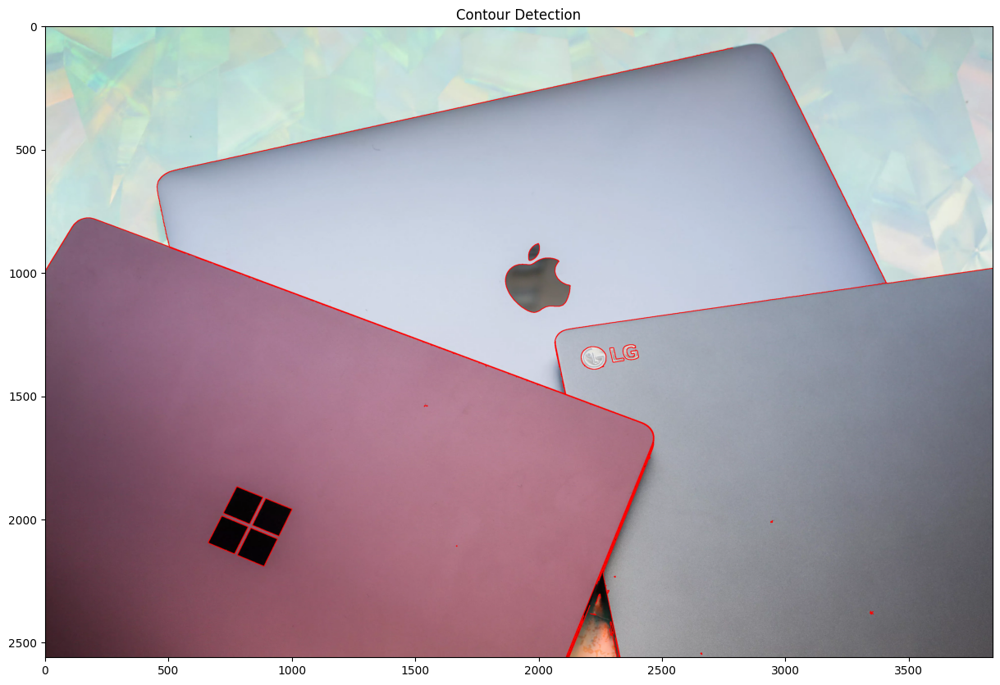

In [28]:
# Load laptop image
img_path = '/content/drive/MyDrive/pcvk/photo/Object Detection/laptop.jpg'
img = cv.imread(img_path)
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Grab the edge using Canny
edges = cv.Canny(img_gray, 30, 200)

# Find contours in the image
contours, _ = cv.findContours(edges, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

# Draw contours on the original image
img_contour = img.copy()
cv.drawContours(img_contour, contours, -1, (0, 0, 255), 2) # -1 to draw all contours

# Show contour detection results
plt.figure(figsize=(20,10))
plt.imshow(cv.cvtColor(img_contour, cv.COLOR_BGR2RGB))
plt.title('Contour Detection')
plt.show()


##  Pengayaan Materi KTP

1. Siapkan file dataset, contoh pada praktik ini menggunakan Maftuchin Tuban

2. Muat 2 library berikut sebagai tahapan persiapan


In [ ]:
import cv2
import os
import matplotlib.pyplot as plt
import numpy as np

3. Tambahkan kode lokalisasi dataset dan lakukan pembacaan file name di dalam direktori dataset tersebut


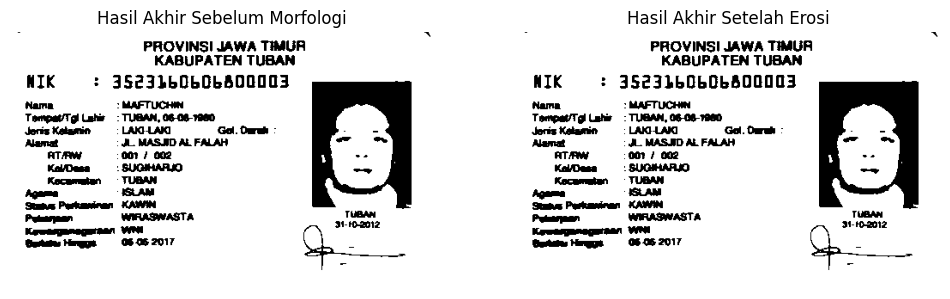

In [29]:
# Lokasi hasil pelat
image_path = '/content/drive/MyDrive/pcvk/photo/KTP_More/ktp3.png'

# Baca gambar
src = cv2.imread(image_path)

# Melanjutkan dengan pra-pemrosesan dan operasi lainnya
blurred = cv2.GaussianBlur(src, (5, 5), 0.5)
gray = cv2.cvtColor(blurred, cv2.COLOR_BGR2GRAY)

# Filtering
for i in range(10):
    blurred = cv2.GaussianBlur(blurred, (1, 1), 0.5)

# Ubah ke grayscale
gray = cv2.cvtColor(blurred, cv2.COLOR_BGR2GRAY)

# Thresholding
ret, bw = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Tampilkan hasil akhir sebelum morfologi
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(bw, cmap='gray')
plt.title('Hasil Akhir Sebelum Morfologi')
plt.axis('off')

# Operasi morfologi erosi
kernel = np.ones((1, 1), np.uint8)
bw_eroded = cv2.erode(bw, kernel, iterations=1)

# Tampilkan hasil akhir setelah erosi
plt.subplot(1, 2, 2)
plt.imshow(bw_eroded, cmap='gray')
plt.title('Hasil Akhir Setelah Erosi')
plt.axis('off')

plt.show()

7. Terapkan ekstraksi kontur untuk untuk mendapatkan semua kontur setiap karakter/obyek.
Kontur harus diseleksi berdasarkan ukuran dan rasio sebuah karakter. Karakter/obyek di dalam KTP ini bervariasi ukuran dan rasionya, sehingga setiap karakter/obyek perlu penanganan yang berbeda. Contoh pada praktik ini berfokus pada karakter yang seukuran dengan NIK. Jika hasil ekstraksi kontur memperlihatkan hasil lain yaitu karakter lain terdeteksi, hal tersebut wajar karena perlu optimize code dan preprocessing yang lebih baik (karena hasil akuisisi setiap citra dapat berbeda).


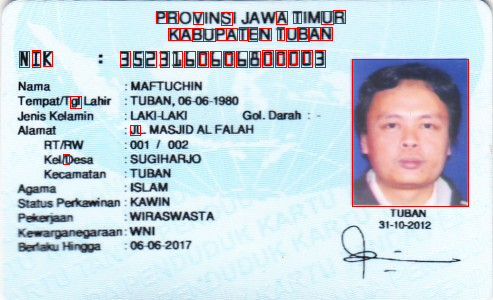

In [31]:
from google.colab.patches import cv2_imshow

# Baca gambar KTP
ktpImage = cv2.imread('/content/drive/MyDrive/pcvk/photo/KTP_More/ktp3.png')

# Ubah gambar menjadi skala abu-abu untuk deteksi tepi
gray = cv2.cvtColor(ktpImage, cv2.COLOR_BGR2GRAY)

blurred = cv2.GaussianBlur(gray, (5, 5), 0)  # (5, 5) adalah ukuran kernel Gaussian, dan 0 adalah deviation

# Thresholding untuk membuat gambar biner
ret, thresholded = cv2.threshold(blurred, 127, 255, cv2.THRESH_BINARY)

# Temukan kontur pada gambar tepi
contours,  hierarchy= cv2.findContours(thresholded, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)

# Gambar kontur pada gambar asli
for cnt in contours:
    x, y, w, h = cv.boundingRect(cnt)
    ras = format(w / h, '.2f')
    if h >= 40 and w >= 10 and float(ras) <= 1:
      cv.rectangle(ktpImage, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)
    elif h >= 10 and w >= 5 and float(ras) <= 1:
      cv.rectangle(ktpImage, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)

# Tampilkan gambar dengan kontur
cv2_imshow(ktpImage)

##  Tugas Praktikum

Setiap citra memiliki karakteristik yang berbeda. Terapkan praktik pada materi pengayaan KTP untuk setiap dataset KTP yang tersedia. Perhatikan kondisi awal dataset, terapkan preprocessing yang sesuai jika kualitas visual citra kurang memadai untuk segera diolah.

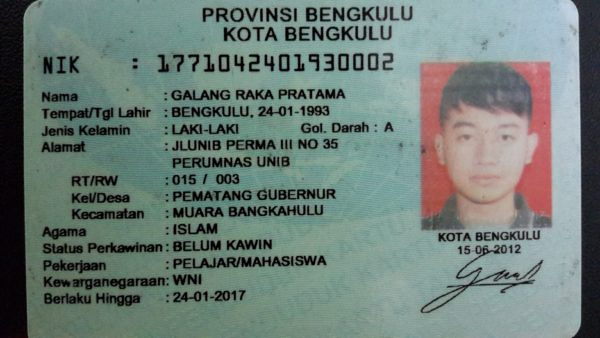

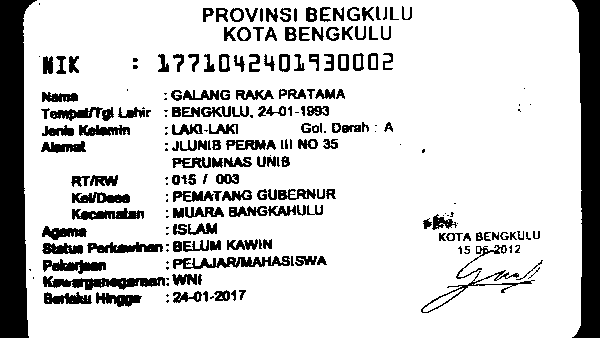

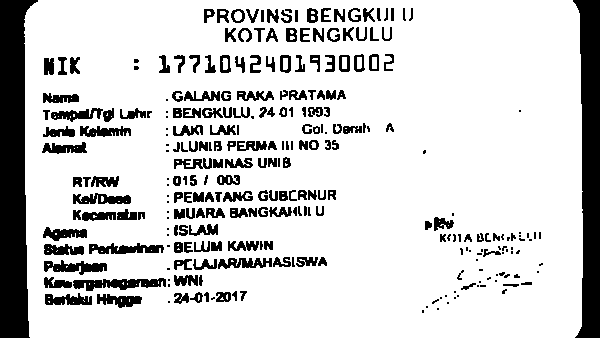

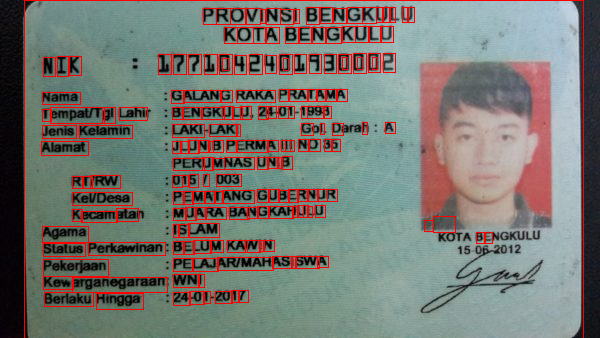

In [32]:
import numpy as np
from skimage import morphology

ktp = cv.imread('/content/drive/MyDrive/pcvk/photo/KTP_More/ktp1.png')

blurred = cv.GaussianBlur(ktp, (21,21), 0.5)

sharpened2 = cv.addWeighted(ktp, 1.5, blurred,-0.5,0)
cv2_imshow(sharpened2)

gray2 = cv.cvtColor(sharpened2, cv.COLOR_BGR2GRAY)


ret2, bw2 = cv.threshold(gray2, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)
# print(ret, bw.shape)

cv2_imshow(bw2)

kernel = np.ones((2,2),np.uint8)

morphology = cv.morphologyEx(bw2, cv.MORPH_CLOSE, kernel)

cv2_imshow(morphology)


contours2, _ = cv.findContours(morphology, cv.RETR_TREE, cv.CHAIN_APPROX_NONE)

for contour in contours2:
  x, y, w, h = cv.boundingRect(contour)
  if(w>3 and h>10):
    result2 = cv.rectangle(ktp, (x, y), (x+w, y+h),(0,0,255),1)

cv2_imshow(result2)